In [2]:
# Import all the necessary modules
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as ticker
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas_datareader as pdr
import math
import datetime
import itertools
import yfinance as yf
import seaborn as sn
from IPython.display import display, HTML
from trend_following import (apply_jupyter_fullscreen_css, load_financial_data, get_returns_volatility, calculate_slope, trend_signal, slope_signal, 
                             create_trend_strategy, get_close_prices, calculate_donchian_channels)
from strategy_performance_metrics import (calculate_sharpe_ratio, calculate_calmar_ratio, calculate_CAGR, calculate_risk_and_performance_metrics,
                                          calculate_compounded_cumulative_returns, estimate_fee_per_trade, rolling_sharpe_ratio)
import coinbase_utils as cn
import strategy_performance_metrics as perf
import trend_following as tf
%matplotlib inline

In [3]:
import importlib
importlib.reload(cn)
importlib.reload(perf)
importlib.reload(tf)

<module 'trend_following' from '/Users/adheerchauhan/Documents/git/trend_following/trend_following.py'>

In [4]:
import warnings
warnings.filterwarnings('ignore')
pd.set_option('Display.max_rows', None)
pd.set_option('Display.max_columns',None)
apply_jupyter_fullscreen_css()

In [5]:
## Trend Following Strategy with Moving Average Crossovers and Donchian Channels
def generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type='exponential', price_or_returns_calc='returns',
                                                rolling_donchian_window=20, include_signal_strength=True, long_only=False, use_coinbase_data=True):
    
    # Generate Trend Signal
    if use_coinbase_data:
        # df = cn.get_coinbase_ohlc_data(ticker=ticker)
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date, 
                                                            end_date=end_date, save_to_file=False)
        df = (df[['close']].rename(columns={'close':ticker}))
        df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    else:
        df = get_close_prices(start_date, end_date, ticker, print_status=False)
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
                                 f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))
    # Generate Donchian Signal
    df_donchian = generate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                             rolling_donchian_window=rolling_donchian_window, use_coinbase_data=use_coinbase_data)
    if price_or_returns_calc == 'price':

        # Buy signal: Price crosses above upper band
        df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
            (df_donchian[f'close'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price']), 1,
            np.where((df_donchian[f'close'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price']), -1, 0))
    elif price_or_returns_calc == 'returns':
        df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
            (df_donchian[f'{ticker}_pct_returns'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_returns']), 1,
            np.where((df_donchian[f'{ticker}_pct_returns'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_returns']), -1, 0))

    # Merging the Trend and donchian Dataframes
    donchian_cols = [f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}',
                     f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_signal']
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')
    
    if include_signal_strength:
        # Calculate the strength of moving average crossover and donchian signal
        df_trend[f'{ticker}_donchian_band_width_{price_or_returns_calc}'] = (df_trend[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] -
                                                                            df_trend[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'])
        donchian_strength = (np.abs(df_trend[f'{ticker}'] - df_trend[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}']) /
                            df_trend[f'{ticker}_donchian_band_width_{price_or_returns_calc}'])
        crossover_strength = np.abs(df_trend[f'{ticker}_{fast_mavg}_mavg'] - df_trend[f'{ticker}_{slow_mavg}_mavg']) / df_trend[f'{ticker}']

        df_trend[f'{ticker}_crossover_donchian_signal_strength'] = (donchian_strength + crossover_strength) / 2
        strength_threshold = 0.5
    
        # Moving Average and Donchian Channel Signal
        buy_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1) &
                      (df_trend[f'{ticker}_trend_signal'] == 1) &
                      (df_trend[f'{ticker}_crossover_donchian_signal_strength'] > strength_threshold))
        sell_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1) &
                       (df_trend[f'{ticker}_trend_signal'] == -1) &
                       ((df_trend[f'{ticker}_crossover_donchian_signal_strength'] > strength_threshold)))
    else:
        # Moving Average and Donchian Channel Signal
        buy_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1) &
                      (df_trend[f'{ticker}_trend_signal'] == 1))
        sell_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1) &
                       (df_trend[f'{ticker}_trend_signal'] == -1))
    
    if long_only:
        df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'] = (
            np.where(buy_signal, 1, 0))
    else:
        df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'] = (
            np.where(buy_signal, 1, np.where(sell_signal, -1, 0)))
        
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal')] * 
        df_trend[f'{ticker}_pct_returns'])
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal')].diff())
    
    return df_trend

def generate_donchian_channels(start_date, end_date, ticker, price_or_returns_calc='price',
                               rolling_donchian_window=20, use_coinbase_data=True):
    if use_coinbase_data:
        # df = cn.get_coinbase_ohlc_data(ticker=ticker)
        # df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date, 
                                                            end_date=end_date, save_to_file=False)
        # df = (df[['close']].rename(columns={'close':ticker}))
        df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    else:
        df = load_financial_data(start_date, end_date, ticker, print_status=False)  # .shift(1)
        df.columns = ['open', 'high', 'low', 'close', 'adjclose', 'volume']

    if price_or_returns_calc == 'price':
        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = (
            df[f'close'].rolling(window=rolling_donchian_window).max())

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = (
            df[f'close'].rolling(window=rolling_donchian_window).min())

    elif price_or_returns_calc == 'returns':
        # Calculate Percent Returns
        df[f'{ticker}_pct_returns'] = df[f'close'].pct_change()

        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).max()

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).min()

    # Middle of the channel (optional, could be just average of upper and lower)
    df[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'] = (
            (df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] +
             df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']) / 2)

    # Shift only the Keltner channel metrics to avoid look-ahead bias
    df[[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']] = df[[
        f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']].shift(1)

    return df

In [6]:
def plot_trend_following_performance(df, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, rolling_sharpe_window):
    
    start_date = pd.to_datetime(start_date).date().strftime('%Y-%m-%d')
    end_date = pd.to_datetime(end_date).date().strftime('%Y-%m-%d')
    fig = plt.figure(figsize=(22,20))
    layout = (5,2)
    trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
    trend_donchian_ax = plt.subplot2grid(layout, (1,0), colspan=2)
    trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
    trend_signal_ax2 = trend_signal_ax.twinx()
    trend_rolling_sharpe_ax = plt.subplot2grid(layout, (3,0), colspan=2)
    trend_return_ax = plt.subplot2grid(layout, (4,0))#, colspan=2)
    trend_cum_return_ax = plt.subplot2grid(layout, (4,1))#, colspan=2)

    if price_or_returns_calc == 'price':
        _ = trend_ax.plot(df.index, df[f'{ticker}'], label='Price')
    elif price_or_returns_calc == 'returns':
        _ = trend_ax.plot(df.index, df[f'{ticker}_pct_returns'], label='Returns')
    for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
        _ = trend_ax.plot(df.index, df[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

    _ = trend_ax.set_title(f'{ticker} Moving Average Ribbons - {start_date} - {end_date}')
    _ = trend_ax.set_ylabel('Price')
    _ = trend_ax.set_xlabel('Date')
    _ = trend_ax.legend(loc='upper left')
    _ = trend_ax.grid()

    if price_or_returns_calc == 'price':
        _ = trend_donchian_ax.plot(df.index, df[f'{ticker}'], label='Price')
    elif price_or_returns_calc == 'returns':
        _ = trend_donchian_ax.plot(df.index, df[f'{ticker}_pct_returns'], label='Returns')
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'], label='Donchian Upper Band', linestyle='--', linewidth=3)
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'], label='Donchian Lower Band', linestyle='--', linewidth=3)

    _ = trend_donchian_ax.set_title(f'{ticker} Donchian Channels')
    _ = trend_donchian_ax.set_ylabel('Price')
    _ = trend_donchian_ax.set_xlabel('Date')
    _ = trend_donchian_ax.legend(loc='upper left')
    _ = trend_donchian_ax.grid()

    _ = trend_signal_ax.plot(df.index,
                             df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'], label='Signal')
    _ = trend_signal_ax2.plot(df.index, df[f'{ticker}'], label='Price', alpha=0.8, color='orange', linestyle='--')
    _ = trend_signal_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Signal')
    _ = trend_signal_ax.set_ylabel('Signal')
    _ = trend_signal_ax.set_xlabel('Date')
    _ = trend_signal_ax.legend(loc='upper left')
    _ = trend_signal_ax.grid()

    _ = trend_rolling_sharpe_ax.plot(df.index,
                                     df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'],
                                     label='Sharpe Ratio', color='orange')
    _ = trend_rolling_sharpe_ax.set_title(f'{ticker} Rolling Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_ylabel('Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_xlabel('Date')
    _ = trend_rolling_sharpe_ax.legend(loc='upper left')
    _ = trend_rolling_sharpe_ax.grid()

    _ = trend_return_ax.plot(df.index,
                             df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'],
                             label='Return')
    _ = trend_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Return')
    _ = trend_return_ax.set_ylabel('Return')
    _ = trend_return_ax.set_xlabel('Date')
    _ = trend_return_ax.legend(loc='upper left')
    _ = trend_return_ax.grid()

    # _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
    _ = trend_cum_return_ax.plot(df.index, df['strategy_cumulative_return'], label='Cum. Return')
    _ = trend_cum_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Cumulative Return')
    _ = trend_cum_return_ax.set_ylabel('Cum. Return')
    _ = trend_cum_return_ax.set_xlabel('Date')
    _ = trend_cum_return_ax.legend(loc='upper left')
    _ = trend_cum_return_ax.grid()


    plt.tight_layout()
    
    return

def get_trend_following_strategy_performance(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window, rolling_sharpe_window, long_only=False,
                                             include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.5, use_coinbase_data=True):
    price_or_returns_calc = 'price'
    df = generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                     mavg_stepsize=mavg_stepsize, price_or_returns_calc=price_or_returns_calc, rolling_donchian_window=rolling_donchian_window,
                                                     include_signal_strength=False, long_only=long_only, use_coinbase_data=use_coinbase_data)
    if include_transaction_costs_and_fees:
        average_fee_per_trade = estimate_fee_per_trade(passive_trade_rate=passive_trade_rate)
        adjusted_daily_returns = df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] - (
            np.abs(df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades']) * (transaction_cost_est + average_fee_per_trade))
        df['strategy_cumulative_return'] = (1 + adjusted_daily_returns).cumprod() - 1
    else:
        df['strategy_cumulative_return'] = (1 + df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns']).cumprod() - 1

    df[f'rolling_sharpe_{rolling_sharpe_window}'] = (perf.rolling_sharpe_ratio(df, window=rolling_sharpe_window, 
    strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'))
    df = df.rename(
        columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'})
    
    plot_trend_following_performance(df, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, rolling_sharpe_window)
    
    return df

In [12]:
## Strategy Parameters
fast_mavg = 50
slow_mavg = 250
mavg_stepsize = 6
rolling_donchian_window = 20

BTC-USD
ETH-USD
SOL-USD
LTC-USD
DOGE-USD
CRO-USD
ADA-USD
AVAX-USD
XRP-USD
SHIB-USD
LINK-USD
UNI-USD
DOT-USD
FET-USD
ALGO-USD
DAI-USD
AAVE-USD
XLM-USD
MATIC-USD
ATOM-USD
MANA-USD
OXT-USD
KRL-USD
AMP-USD
REQ-USD
SKL-USD
GRT-USD
MOBILE-USD
AIOZ-USD
ZRO-USD
HNT-USD
HONEY-USD


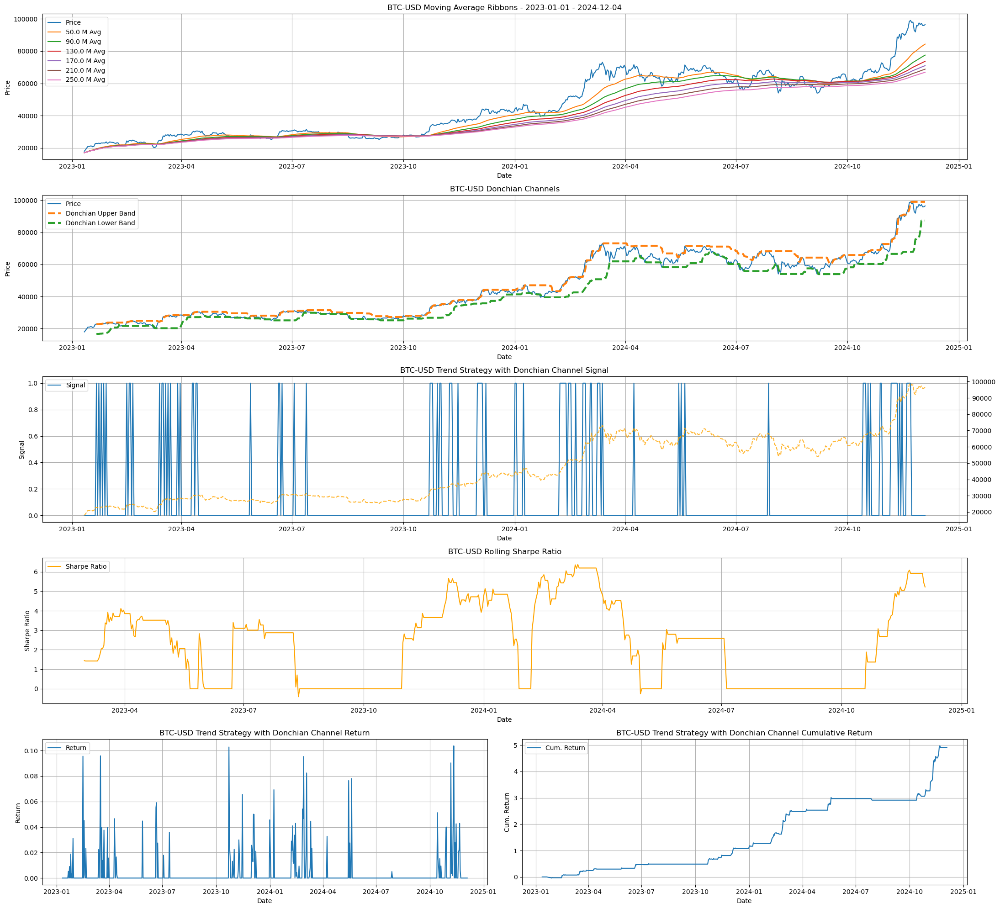

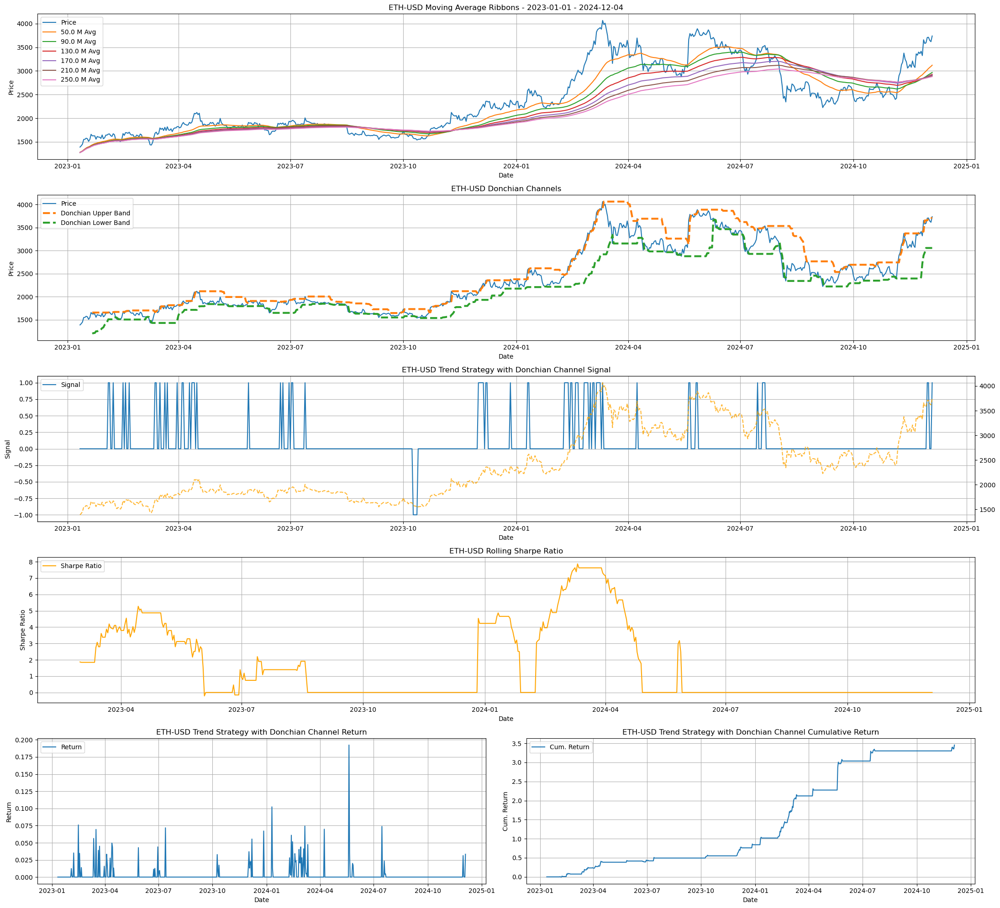

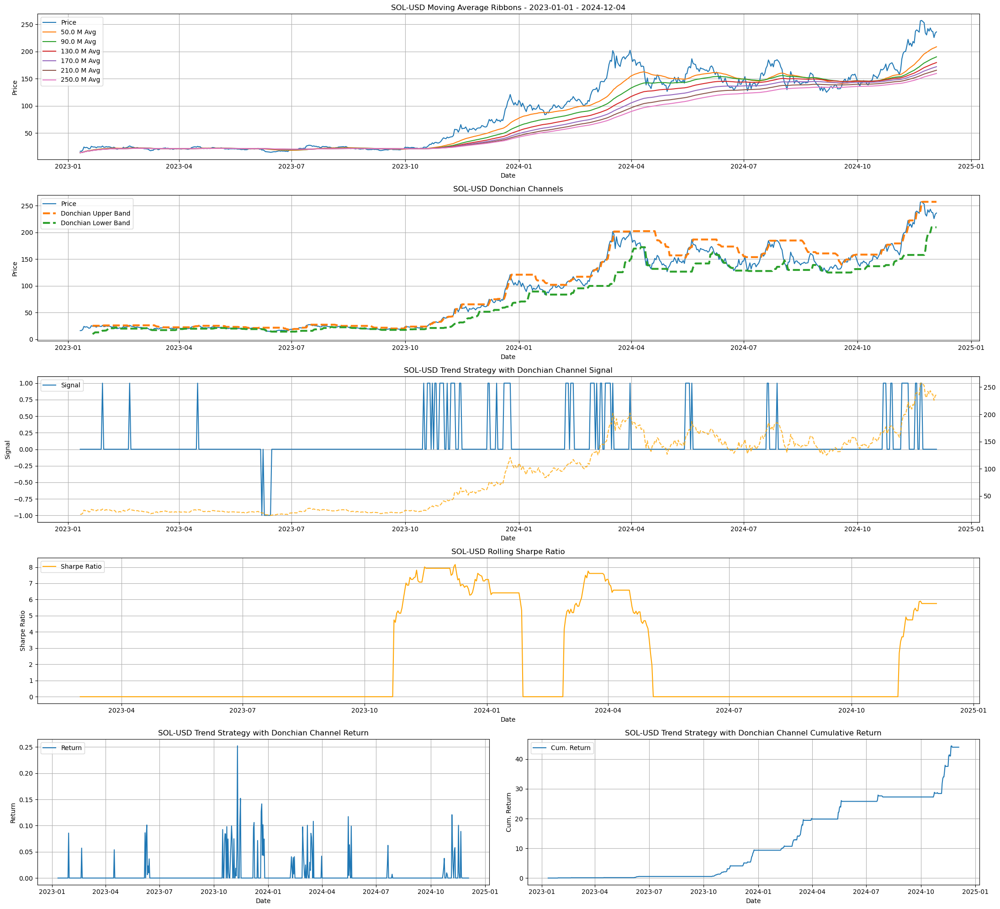

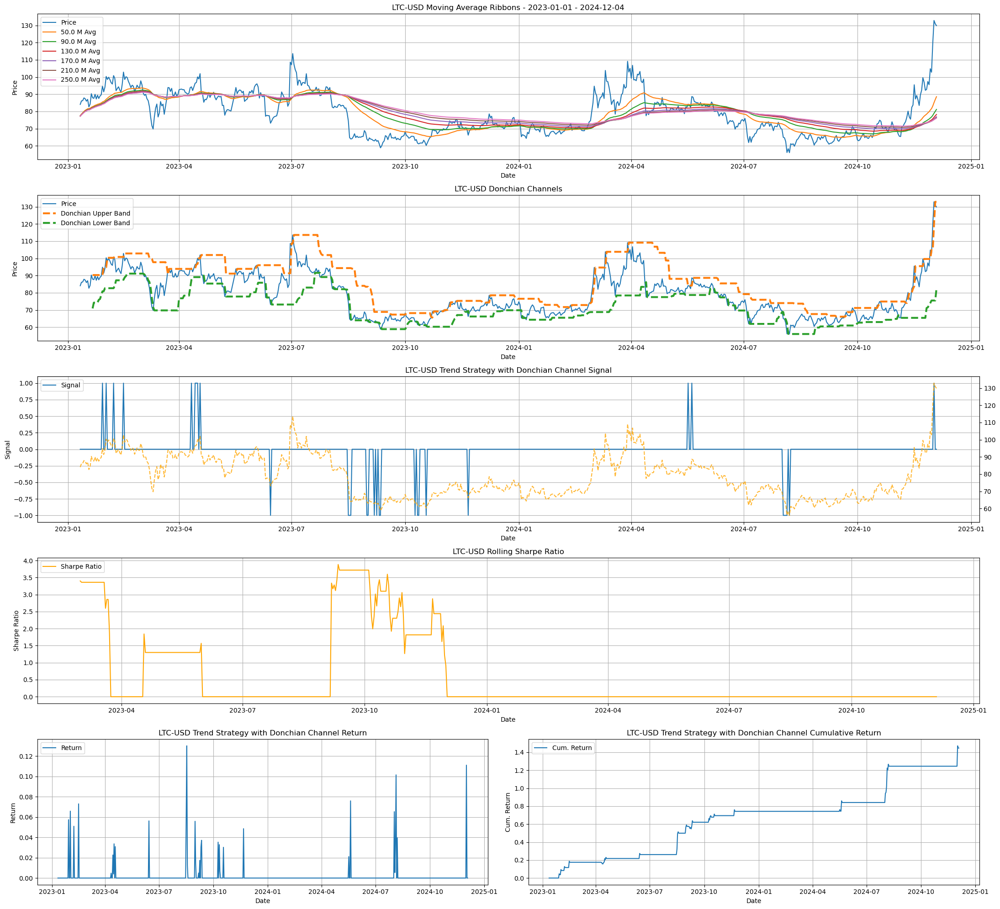

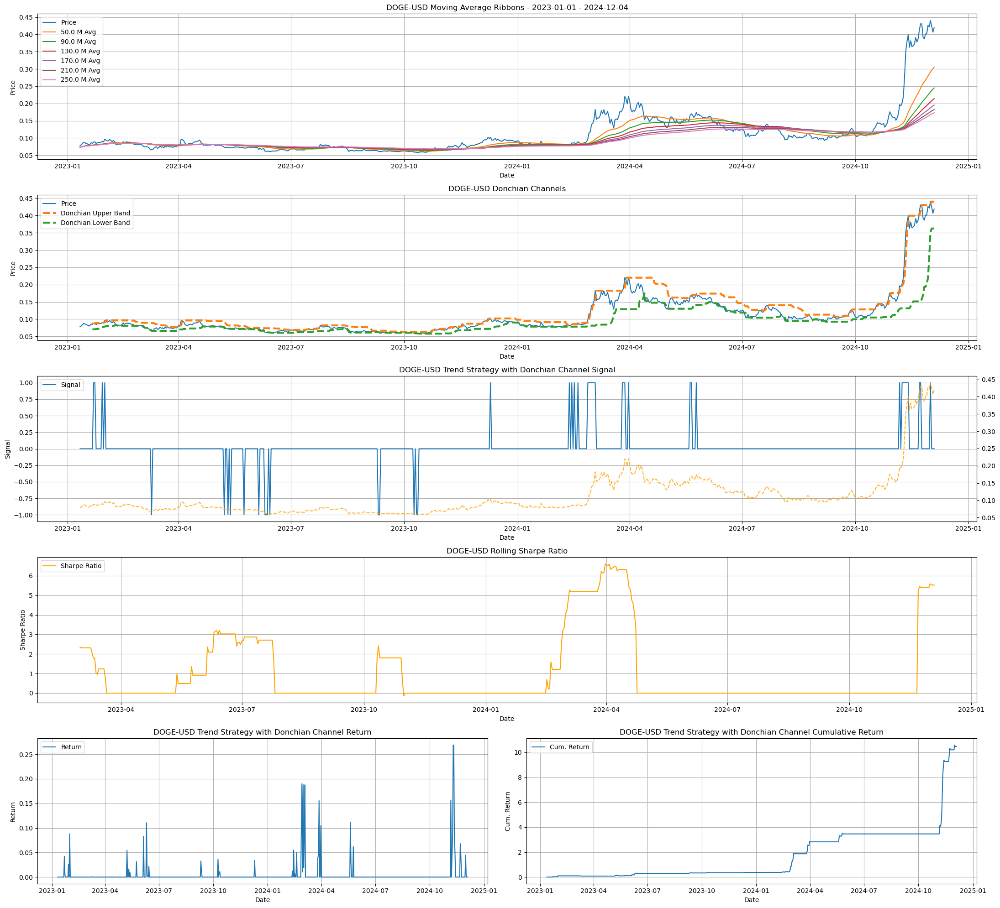

...

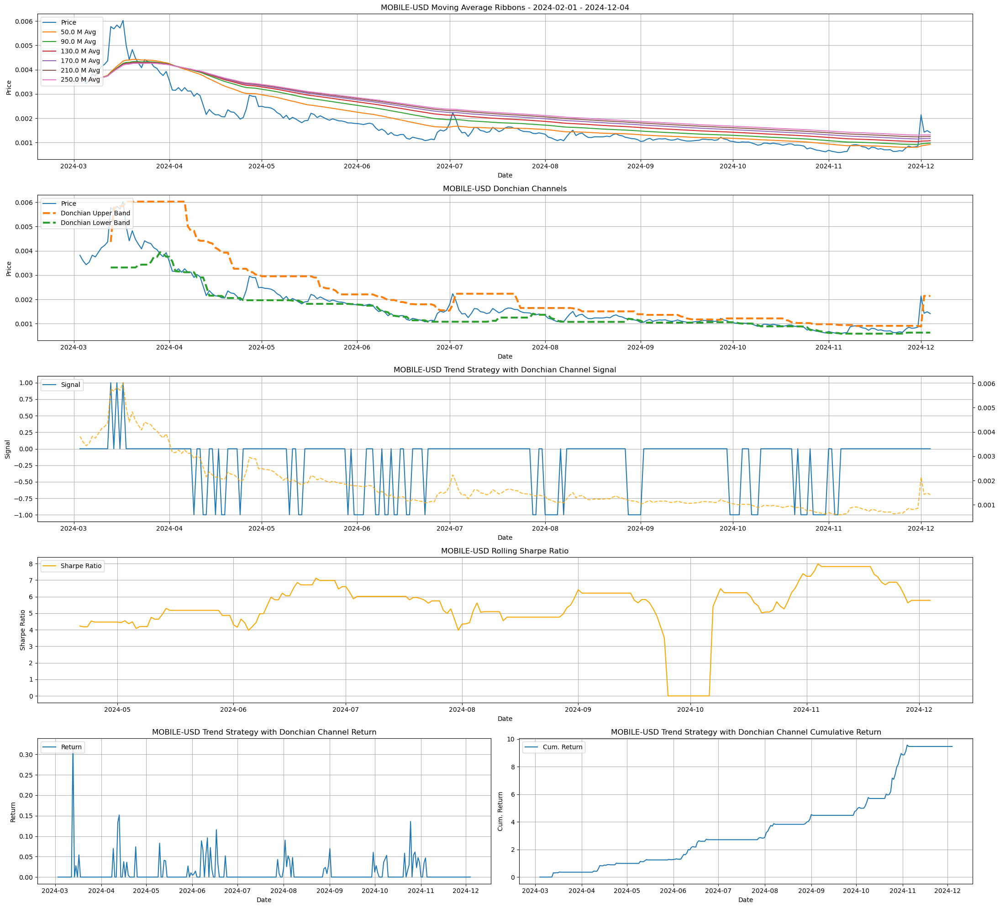

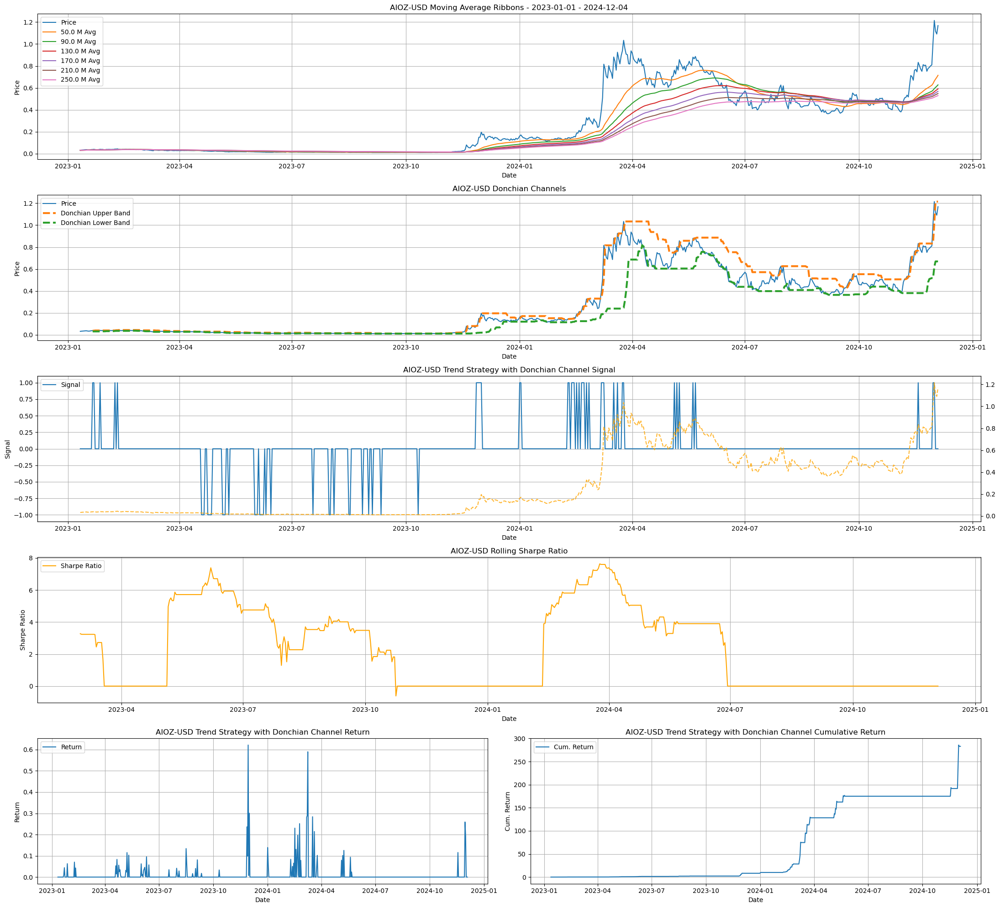

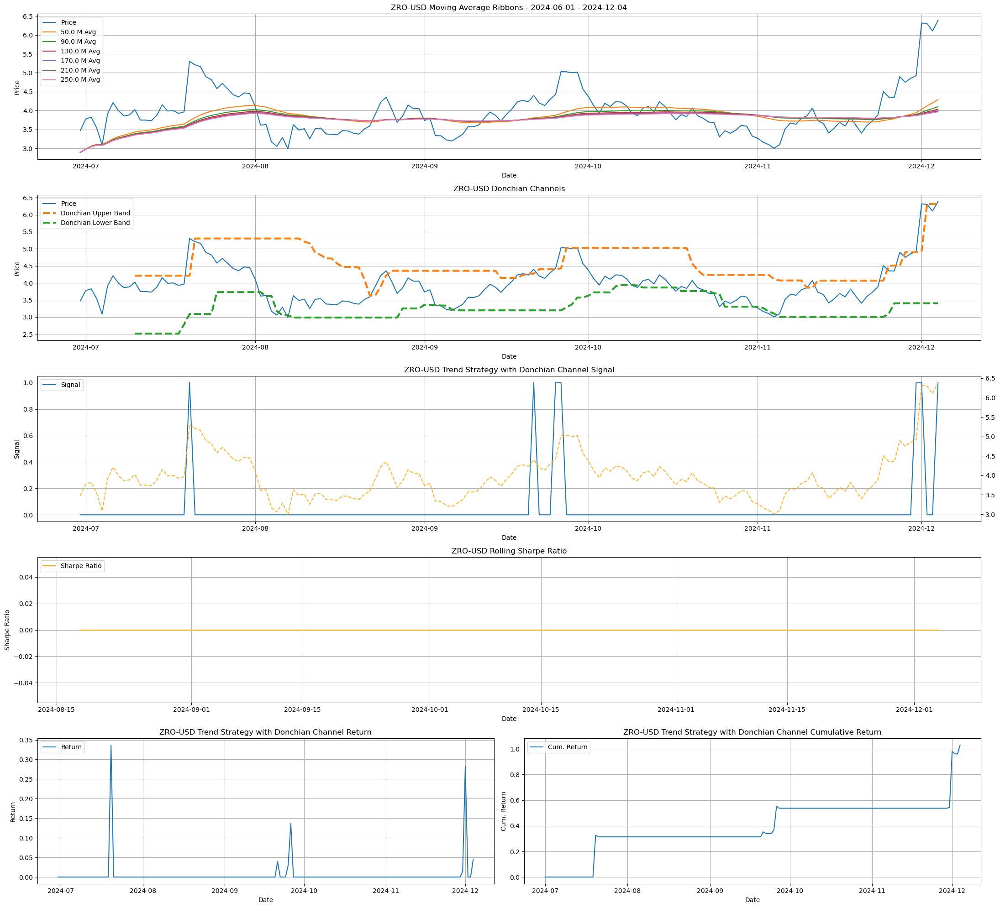

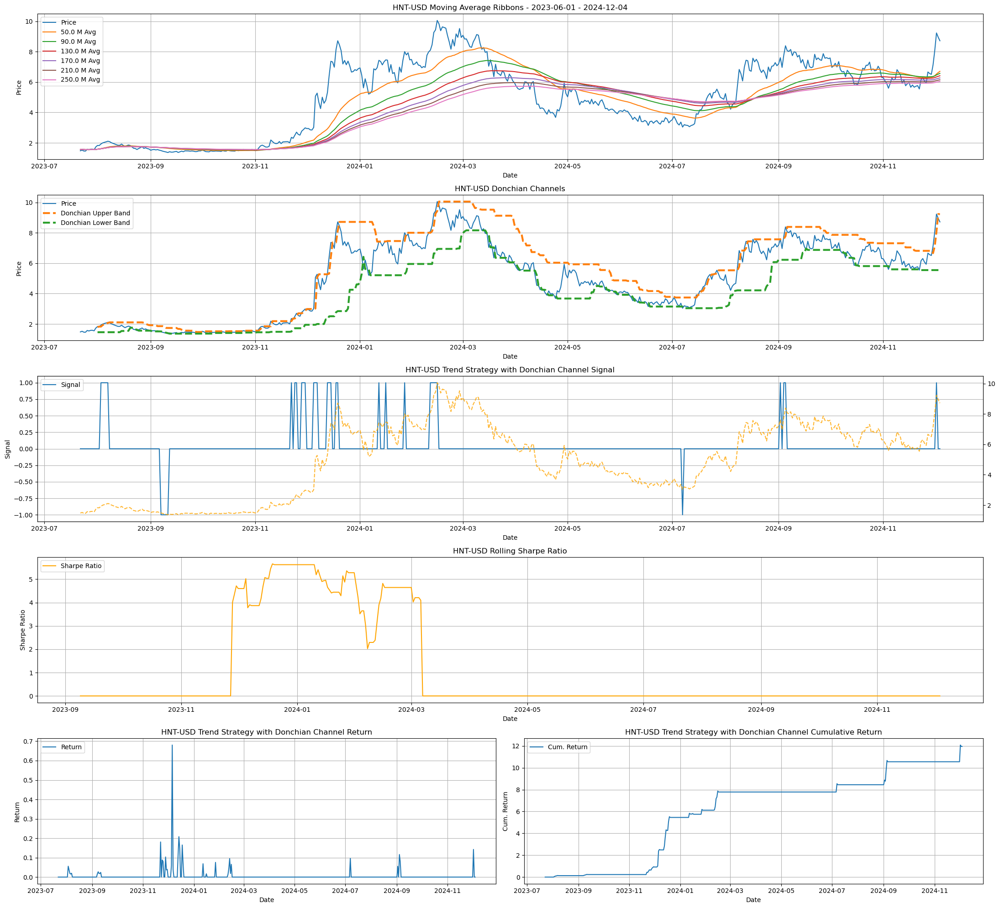

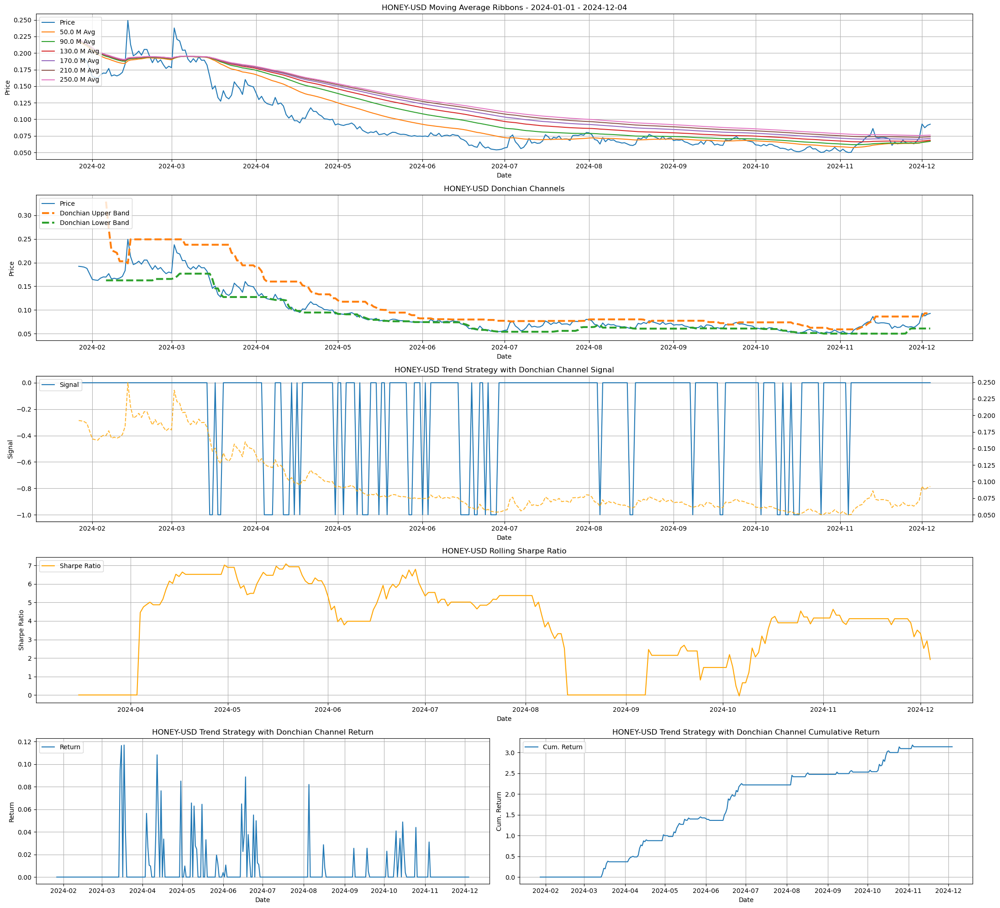

In [51]:
trend_df_dict = {}
coinbase_ticker_list = list(cn.coinbase_start_date_by_ticker_dict.keys())
start_date_dict = cn.coinbase_start_date_by_ticker_dict
start_date = '2023-01-01'
end_date = datetime.datetime.now().date()#.strftime('%Y-%m-%d')
for ticker in coinbase_ticker_list:
    print(ticker)
    if pd.to_datetime(start_date_dict[ticker]).date() > pd.to_datetime(start_date).date():
        _df_trend = get_trend_following_strategy_performance(start_date=pd.to_datetime(start_date_dict[ticker]).date(), end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                             mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window, rolling_sharpe_window=50)
    else:
        _df_trend = get_trend_following_strategy_performance(start_date=pd.to_datetime(start_date).date(), end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                         mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window, rolling_sharpe_window=50)
    _df_trend[f'{ticker}_t_1_close'] = _df_trend[f'{ticker}'].shift(1)
    trend_df_dict[ticker] = _df_trend

In [52]:
ticker = 'AVAX-USD'
signal_cols = [f'{ticker}',f'{ticker}_trend_signal',f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price',f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price',
               f'{ticker}_{rolling_donchian_window}_donchian_signal',f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal']

In [53]:
trade_cols = ['trade_date','ticker','t_1_close_price','trend_donchian_signal','donchian_lower_band','donchian_upper_band']
df_trade = pd.DataFrame(columns=trade_cols)
for ticker in coinbase_ticker_list:
    df_trend = trend_df_dict[ticker]
    trend_donchian_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
    print(ticker, df_trend[trend_donchian_signal_col][-1])
    if df_trend[trend_donchian_signal_col][-1] != 0:
        row = {
            'trade_date': end_date,
            'ticker': ticker,
            't_1_close_price': df_trend[f'{ticker}_t_1_close'][-1],
            'trend_donchian_signal': df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'][-1],
            'donchian_lower_band': df_trend[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price'][-1],
            'donchian_upper_band': df_trend[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price'][-1]
        }
        df_trade.loc[len(df_trade)] = row

BTC-USD 0
ETH-USD 1
SOL-USD 0
LTC-USD 0
DOGE-USD 0
CRO-USD 1
ADA-USD 1
AVAX-USD 1
XRP-USD 0
SHIB-USD 0
LINK-USD 0
UNI-USD 1
DOT-USD 0
FET-USD 0
ALGO-USD 1
DAI-USD 0
AAVE-USD 1
XLM-USD 0
MATIC-USD 0
ATOM-USD 0
MANA-USD 0
OXT-USD 0
KRL-USD 0
AMP-USD 0
REQ-USD 0
SKL-USD 0
GRT-USD 0
MOBILE-USD 0
AIOZ-USD 0
ZRO-USD 1
HNT-USD 0
HONEY-USD 0


In [54]:
df_trade

,trade_date,ticker,t_1_close_price,trend_donchian_signal,donchian_lower_band,donchian_upper_band
0,2024-12-04,ETH-USD,3617.5900,1,3059.0400,3710.2400
1,2024-12-04,CRO-USD,0.2041,1,0.1502,0.2048
2,2024-12-04,ADA-USD,1.1920,1,0.5790,1.2024
3,2024-12-04,AVAX-USD,50.9500,1,31.1900,52.3000
4,2024-12-04,UNI-USD,15.1260,1,8.1770,15.1260
5,2024-12-04,ALGO-USD,0.5063,1,0.1452,0.5063
6,2024-12-04,AAVE-USD,240.7600,1,156.8800,240.7600
7,2024-12-04,ZRO-USD,6.1070,1,3.4040,6.3170


## Coinbase Portfolio Analysis

In [59]:
portfolio_cols = ['asset','allocation','total_balance_crypto']
df_portfolio = cn.get_portfolio_breakdown(cn.get_coinbase_rest_api_client(cn.key_location))
df_portfolio['asset'] = df_portfolio['asset'].apply(lambda x: f"{x}-USD")
df_portfolio_trim = df_portfolio[portfolio_cols].reset_index(drop=True)

## Coinbase Ticker List
coinbase_ticker_list = list(cn.coinbase_start_date_by_ticker_dict.keys())
df_portfolio_trim = df_portfolio_trim[df_portfolio_trim.asset.isin(coinbase_ticker_list)].reset_index(drop=True)

In [60]:
df_portfolio_trim.sort_values('allocation', ascending=False)

,asset,allocation,total_balance_crypto
6,ETH-USD,3.637443e-01,2.538363e+00
21,BTC-USD,1.876012e-01,5.067271e-02
22,SOL-USD,1.845982e-01,2.037630e+01
18,ADA-USD,5.859520e-02,1.235562e+03
3,ALGO-USD,3.427282e-02,1.711901e+03
13,DOT-USD,2.879734e-02,6.788347e+01
12,FET-USD,2.584927e-02,3.429168e+02
1,AVAX-USD,2.374362e-02,1.144058e+01
8,AAVE-USD,2.039513e-02,2.089058e+00
20,DAI-USD,1.332898e-02,3.470846e+02


In [63]:
def sharpe_on_window(window_df, strategy_daily_return_col):
    # Calculate the Sharpe ratio on the windowed data frame
    return calculate_sharpe_ratio(window_df, strategy_daily_return_col, strategy_trade_count_col=None, include_transaction_costs_and_fees=False)

In [65]:
rolling_sharpe_window = 20
ticker_list = df_portfolio_trim.asset.unique().tolist()
daily_portfolio_dict = {}
start_date = max(cn.coinbase_start_date_by_ticker_dict.values())
for ticker in ticker_list:
    # start_date = pd.to_datetime(cn.coinbase_start_date_by_ticker_dict[ticker]).date()
    df_portfolio_daily_position = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                                                 end_date=end_date, save_to_file=False)
    df_portfolio_daily_position = (df_portfolio_daily_position[['close']]
                                   .rename(columns={'close':f'{ticker}_close'}))
    # df_portfolio_daily_position = df_portfolio_daily_position[((df_portfolio_daily_position.index.get_level_values('date') >= start_date) &
    #                                                            (df_portfolio_daily_position.index.get_level_values('date') <= end_date))]
    df_portfolio_daily_position[f'{ticker}_position'] = df_portfolio_trim[df_portfolio_trim.asset == ticker].total_balance_crypto.values[0]
    df_portfolio_daily_position[f'{ticker}_position_weight'] = df_portfolio_trim[df_portfolio_trim.asset == ticker].allocation.values[0]
    df_portfolio_daily_position[f'{ticker}_portfolio_value'] = df_portfolio_daily_position[f'{ticker}_close'] * df_portfolio_daily_position[f'{ticker}_position']
    df_portfolio_daily_position[f'{ticker}_pct_returns'] = df_portfolio_daily_position[f'{ticker}_portfolio_value'].pct_change()
    df_portfolio_daily_position[f'{ticker}_weighted_pct_returns'] = df_portfolio_daily_position[f'{ticker}_pct_returns'] * df_portfolio_daily_position[f'{ticker}_position_weight']
    df_portfolio_daily_position[f'{ticker}_{rolling_sharpe_window}_rolling_sharpe_ratio'] = (df_portfolio_daily_position[f'{ticker}_pct_returns'].rolling(window=rolling_sharpe_window)
                                                                                             .apply(lambda x: sharpe_on_window(df_portfolio_daily_position.loc[x.index], strategy_daily_return_col=f'{ticker}_pct_returns'), raw=False))
    daily_portfolio_dict[ticker] = df_portfolio_daily_position

In [66]:
df_portfolio_daily = pd.concat(daily_portfolio_dict, axis=1)
## Assign new column names to the dataframe
df_portfolio_daily.columns = df_portfolio_daily.columns.to_flat_index()
cols = []
for ticker in ticker_list:
    trend_cols = [f'{ticker}_close',f'{ticker}_position',f'{ticker}_position_weight',f'{ticker}_portfolio_value',f'{ticker}_pct_returns',f'{ticker}_weighted_pct_returns',f'{ticker}_{rolling_sharpe_window}_rolling_sharpe_ratio']
    cols.append(trend_cols)
cols = [item for sublist in cols for item in sublist]
df_portfolio_daily.columns = cols

## Total Portfolio Return
return_cols = [f'{ticker}_weighted_pct_returns' for ticker in ticker_list]
portfolio_value_cols = [f'{ticker}_portfolio_value' for ticker in ticker_list]
df_portfolio_daily['total_pct_returns'] = df_portfolio_daily[return_cols].sum(axis=1)
df_portfolio_daily['total_portfolio_value'] = df_portfolio_daily[portfolio_value_cols].sum(axis=1)
df_portfolio_daily[f'total_portoflio_{rolling_sharpe_window}_rolling_sharpe_ratio'] = (df_portfolio_daily['total_pct_returns'].rolling(window=rolling_sharpe_window)
                                                                                       .apply(lambda x: sharpe_on_window(df_portfolio_daily.loc[x.index], strategy_daily_return_col=f'{ticker}_pct_returns'), raw=False))

In [67]:
df_portfolio_daily.head()

,AMP-USD_close,AMP-USD_position,AMP-USD_position_weight,AMP-USD_portfolio_value,AMP-USD_pct_returns,AMP-USD_weighted_pct_returns,AMP-USD_20_rolling_sharpe_ratio,AVAX-USD_close,AVAX-USD_position,AVAX-USD_position_weight,AVAX-USD_portfolio_value,AVAX-USD_pct_returns,AVAX-USD_weighted_pct_returns,AVAX-USD_20_rolling_sharpe_ratio,GRT-USD_close,GRT-USD_position,GRT-USD_position_weight,GRT-USD_portfolio_value,GRT-USD_pct_returns,GRT-USD_weighted_pct_returns,GRT-USD_20_rolling_sharpe_ratio,ALGO-USD_close,ALGO-USD_position,ALGO-USD_position_weight,ALGO-USD_portfolio_value,ALGO-USD_pct_returns,ALGO-USD_weighted_pct_returns,ALGO-USD_20_rolling_sharpe_ratio,MATIC-USD_close,MATIC-USD_position,MATIC-USD_position_weight,MATIC-USD_portfolio_value,MATIC-USD_pct_returns,MATIC-USD_weighted_pct_returns,MATIC-USD_20_rolling_sharpe_ratio,KRL-USD_close,KRL-USD_position,KRL-USD_position_weight,KRL-USD_portfolio_value,KRL-USD_pct_returns,KRL-USD_weighted_pct_returns,KRL-USD_20_rolling_sharpe_ratio,ETH-USD_close,ETH-USD_position,ETH-USD_position_weight,ETH-USD_portfolio_value,ETH-USD_pct_returns,ETH-USD_weighted_pct_returns,ETH-USD_20_rolling_sharpe_ratio,ATOM-USD_close,ATOM-USD_position,ATOM-USD_position_weight,ATOM-USD_portfolio_value,ATOM-USD_pct_returns,ATOM-USD_weighted_pct_returns,ATOM-USD_20_rolling_sharpe_ratio,AAVE-USD_close,AAVE-USD_position,AAVE-USD_position_weight,AAVE-USD_portfolio_value,AAVE-USD_pct_returns,AAVE-USD_weighted_pct_returns,AAVE-USD_20_rolling_sharpe_ratio,SHIB-USD_close,SHIB-USD_position,SHIB-USD_position_weight,SHIB-USD_portfolio_value,SHIB-USD_pct_returns,SHIB-USD_weighted_pct_returns,SHIB-USD_20_rolling_sharpe_ratio,SKL-USD_close,SKL-USD_position,SKL-USD_position_weight,SKL-USD_portfolio_value,SKL-USD_pct_returns,SKL-USD_weighted_pct_returns,SKL-USD_20_rolling_sharpe_ratio,UNI-USD_close,UNI-USD_position,UNI-USD_position_weight,UNI-USD_portfolio_value,UNI-USD_pct_returns,UNI-USD_weighted_pct_returns,UNI-USD_20_rolling_sharpe_ratio,FET-USD_close,FET-USD_position,FET-USD_position_weight,FET-USD_portfolio_value,FET-USD_pct_returns,FET-USD_weighted_pct_returns,FET-USD_20_rolling_sharpe_ratio,DOT-USD_close,DOT-USD_position,DOT-USD_position_weight,DOT-USD_portfolio_value,DOT-USD_pct_returns,DOT-USD_weighted_pct_returns,DOT-USD_20_rolling_sharpe_ratio,DOGE-USD_close,DOGE-USD_position,DOGE-USD_position_weight,DOGE-USD_portfolio_value,DOGE-USD_pct_returns,DOGE-USD_weighted_pct_returns,DOGE-USD_20_rolling_sharpe_ratio,OXT-USD_close,OXT-USD_position,OXT-USD_position_weight,OXT-USD_portfolio_value,OXT-USD_pct_returns,OXT-USD_weighted_pct_returns,OXT-USD_20_rolling_sharpe_ratio,LTC-USD_close,LTC-USD_position,LTC-USD_position_weight,LTC-USD_portfolio_value,LTC-USD_pct_returns,LTC-USD_weighted_pct_returns,LTC-USD_20_rolling_sharpe_ratio,MANA-USD_close,MANA-USD_position,MANA-USD_position_weight,MANA-USD_portfolio_value,MANA-USD_pct_returns,MANA-USD_weighted_pct_returns,MANA-USD_20_rolling_sharpe_ratio,ADA-USD_close,ADA-USD_position,ADA-USD_position_weight,ADA-USD_portfolio_value,ADA-USD_pct_returns,ADA-USD_weighted_pct_returns,ADA-USD_20_rolling_sharpe_ratio,XLM-USD_close,XLM-USD_position,XLM-USD_position_weight,XLM-USD_portfolio_value,XLM-USD_pct_returns,XLM-USD_weighted_pct_returns,XLM-USD_20_rolling_sharpe_ratio,DAI-USD_close,DAI-USD_position,DAI-USD_position_weight,DAI-USD_portfolio_value,DAI-USD_pct_returns,DAI-USD_weighted_pct_returns,DAI-USD_20_rolling_sharpe_ratio,BTC-USD_close,BTC-USD_position,BTC-USD_position_weight,BTC-USD_portfolio_value,BTC-USD_pct_returns,BTC-USD_weighted_pct_returns,BTC-USD_20_rolling_sharpe_ratio,SOL-USD_close,SOL-USD_position,SOL-USD_position_weight,SOL-USD_portfolio_value,SOL-USD_pct_returns,SOL-USD_weighted_pct_returns,SOL-USD_20_rolling_sharpe_ratio,REQ-USD_close,REQ-USD_position,REQ-USD_position_weight,REQ-USD_portfolio_value,REQ-USD_pct_returns,REQ-USD_weighted_pct_returns,REQ-USD_20_rolling_sharpe_ratio,total_pct_returns,total_portfolio_value,total_portoflio_20_rolling_sharpe_ratio
date,,,,,,,,,,,,

In [68]:
ticker_list = df_portfolio_trim.sort_values('allocation', ascending=False).asset.unique().tolist()
for ticker in ticker_list:
    print(f"{ticker} Sharpe Ratio: {perf.calculate_sharpe_ratio(df_portfolio_daily, strategy_daily_return_col=f'{ticker}_pct_returns', strategy_trade_count_col=None, include_transaction_costs_and_fees=False)}")

print(f"Total Portfolio Sharpe Ratio: {perf.calculate_sharpe_ratio(df_portfolio_daily, strategy_daily_return_col='total_pct_returns', strategy_trade_count_col=None, include_transaction_costs_and_fees=False)}")

ETH-USD Sharpe Ratio: 0.10902325158967724
BTC-USD Sharpe Ratio: 1.233869086098825
SOL-USD Sharpe Ratio: 0.979705182203359
ADA-USD Sharpe Ratio: 2.160963935336784
ALGO-USD Sharpe Ratio: 1.909744688990674
DOT-USD Sharpe Ratio: 1.1234558153389975
FET-USD Sharpe Ratio: 0.3495155158332319
AVAX-USD Sharpe Ratio: 1.0472572562829534
AAVE-USD Sharpe Ratio: 1.8290917885739417
DAI-USD Sharpe Ratio: -27.54680187056986
XLM-USD Sharpe Ratio: 2.3709392915419962
LTC-USD Sharpe Ratio: 1.2175800237895287
MATIC-USD Sharpe Ratio: 0.37047019860337116
DOGE-USD Sharpe Ratio: 1.925932159046632
ATOM-USD Sharpe Ratio: 0.7309006364132822
MANA-USD Sharpe Ratio: 1.167940600363906
SHIB-USD Sharpe Ratio: 0.6300172876817276
OXT-USD Sharpe Ratio: 0.7041859458532708
AMP-USD Sharpe Ratio: 1.1251001610282056
KRL-USD Sharpe Ratio: 0.5394216424536538
REQ-USD Sharpe Ratio: 0.3331954488247683
SKL-USD Sharpe Ratio: 0.462689795426947
GRT-USD Sharpe Ratio: 0.4822329415867578
UNI-USD Sharpe Ratio: 1.1090957917617872
Total Portfo

In [69]:
top_ticker_list = df_portfolio.groupby(['asset']).agg({'total_balance_fiat':'sum'}).sort_values('total_balance_fiat', ascending=False).index[0:8].tolist()

In [70]:
df_portfolio_daily.tail()

,AMP-USD_close,AMP-USD_position,AMP-USD_position_weight,AMP-USD_portfolio_value,AMP-USD_pct_returns,AMP-USD_weighted_pct_returns,AMP-USD_20_rolling_sharpe_ratio,AVAX-USD_close,AVAX-USD_position,AVAX-USD_position_weight,AVAX-USD_portfolio_value,AVAX-USD_pct_returns,AVAX-USD_weighted_pct_returns,AVAX-USD_20_rolling_sharpe_ratio,GRT-USD_close,GRT-USD_position,GRT-USD_position_weight,GRT-USD_portfolio_value,GRT-USD_pct_returns,GRT-USD_weighted_pct_returns,GRT-USD_20_rolling_sharpe_ratio,ALGO-USD_close,ALGO-USD_position,ALGO-USD_position_weight,ALGO-USD_portfolio_value,ALGO-USD_pct_returns,ALGO-USD_weighted_pct_returns,ALGO-USD_20_rolling_sharpe_ratio,MATIC-USD_close,MATIC-USD_position,MATIC-USD_position_weight,MATIC-USD_portfolio_value,MATIC-USD_pct_returns,MATIC-USD_weighted_pct_returns,MATIC-USD_20_rolling_sharpe_ratio,KRL-USD_close,KRL-USD_position,KRL-USD_position_weight,KRL-USD_portfolio_value,KRL-USD_pct_returns,KRL-USD_weighted_pct_returns,KRL-USD_20_rolling_sharpe_ratio,ETH-USD_close,ETH-USD_position,ETH-USD_position_weight,ETH-USD_portfolio_value,ETH-USD_pct_returns,ETH-USD_weighted_pct_returns,ETH-USD_20_rolling_sharpe_ratio,ATOM-USD_close,ATOM-USD_position,ATOM-USD_position_weight,ATOM-USD_portfolio_value,ATOM-USD_pct_returns,ATOM-USD_weighted_pct_returns,ATOM-USD_20_rolling_sharpe_ratio,AAVE-USD_close,AAVE-USD_position,AAVE-USD_position_weight,AAVE-USD_portfolio_value,AAVE-USD_pct_returns,AAVE-USD_weighted_pct_returns,AAVE-USD_20_rolling_sharpe_ratio,SHIB-USD_close,SHIB-USD_position,SHIB-USD_position_weight,SHIB-USD_portfolio_value,SHIB-USD_pct_returns,SHIB-USD_weighted_pct_returns,SHIB-USD_20_rolling_sharpe_ratio,SKL-USD_close,SKL-USD_position,SKL-USD_position_weight,SKL-USD_portfolio_value,SKL-USD_pct_returns,SKL-USD_weighted_pct_returns,SKL-USD_20_rolling_sharpe_ratio,UNI-USD_close,UNI-USD_position,UNI-USD_position_weight,UNI-USD_portfolio_value,UNI-USD_pct_returns,UNI-USD_weighted_pct_returns,UNI-USD_20_rolling_sharpe_ratio,FET-USD_close,FET-USD_position,FET-USD_position_weight,FET-USD_portfolio_value,FET-USD_pct_returns,FET-USD_weighted_pct_returns,FET-USD_20_rolling_sharpe_ratio,DOT-USD_close,DOT-USD_position,DOT-USD_position_weight,DOT-USD_portfolio_value,DOT-USD_pct_returns,DOT-USD_weighted_pct_returns,DOT-USD_20_rolling_sharpe_ratio,DOGE-USD_close,DOGE-USD_position,DOGE-USD_position_weight,DOGE-USD_portfolio_value,DOGE-USD_pct_returns,DOGE-USD_weighted_pct_returns,DOGE-USD_20_rolling_sharpe_ratio,OXT-USD_close,OXT-USD_position,OXT-USD_position_weight,OXT-USD_portfolio_value,OXT-USD_pct_returns,OXT-USD_weighted_pct_returns,OXT-USD_20_rolling_sharpe_ratio,LTC-USD_close,LTC-USD_position,LTC-USD_position_weight,LTC-USD_portfolio_value,LTC-USD_pct_returns,LTC-USD_weighted_pct_returns,LTC-USD_20_rolling_sharpe_ratio,MANA-USD_close,MANA-USD_position,MANA-USD_position_weight,MANA-USD_portfolio_value,MANA-USD_pct_returns,MANA-USD_weighted_pct_returns,MANA-USD_20_rolling_sharpe_ratio,ADA-USD_close,ADA-USD_position,ADA-USD_position_weight,ADA-USD_portfolio_value,ADA-USD_pct_returns,ADA-USD_weighted_pct_returns,ADA-USD_20_rolling_sharpe_ratio,XLM-USD_close,XLM-USD_position,XLM-USD_position_weight,XLM-USD_portfolio_value,XLM-USD_pct_returns,XLM-USD_weighted_pct_returns,XLM-USD_20_rolling_sharpe_ratio,DAI-USD_close,DAI-USD_position,DAI-USD_position_weight,DAI-USD_portfolio_value,DAI-USD_pct_returns,DAI-USD_weighted_pct_returns,DAI-USD_20_rolling_sharpe_ratio,BTC-USD_close,BTC-USD_position,BTC-USD_position_weight,BTC-USD_portfolio_value,BTC-USD_pct_returns,BTC-USD_weighted_pct_returns,BTC-USD_20_rolling_sharpe_ratio,SOL-USD_close,SOL-USD_position,SOL-USD_position_weight,SOL-USD_portfolio_value,SOL-USD_pct_returns,SOL-USD_weighted_pct_returns,SOL-USD_20_rolling_sharpe_ratio,REQ-USD_close,REQ-USD_position,REQ-USD_position_weight,REQ-USD_portfolio_value,REQ-USD_pct_returns,REQ-USD_weighted_pct_returns,REQ-USD_20_rolling_sharpe_ratio,total_pct_returns,total_portfolio_value,total_portoflio_20_rolling_sharpe_ratio
date,,,,,,,,,,,,

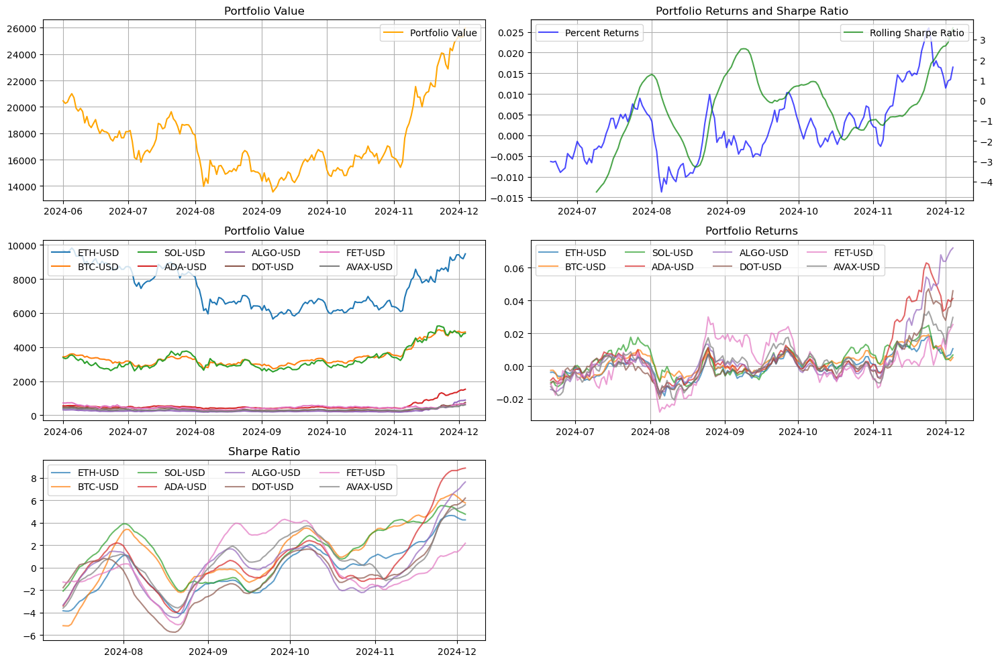

In [71]:
fig = plt.figure(figsize=(15,10))
layout = (3,2)
strategy_val_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
strategy_perf_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
strategy_perf_ax2 = strategy_perf_ax.twinx()

ticker_val_ax = plt.subplot2grid(layout, (1,0))#, colspan=2)
ticker_returns_ax = plt.subplot2grid(layout, (1,1))#, colspan=2)
ticker_sharpe_ax = plt.subplot2grid(layout, (2,0))#, colspan=2)
# strategy_target_position_ax = plt.subplot2grid(layout, (1,0))#, colspan=2)
# sharpe_ax = plt.subplot2grid(layout, (2,0))

_ = strategy_val_ax.plot(df_portfolio_daily.index, df_portfolio_daily[f'total_portfolio_value'], label=f'Portfolio Value', color='orange')
_ = strategy_perf_ax.plot(df_portfolio_daily.index, df_portfolio_daily[f'total_pct_returns'].rolling(20).mean(), label=f'Percent Returns', color='blue', alpha=0.7)
_ = strategy_perf_ax2.plot(df_portfolio_daily.index, df_portfolio_daily[f'total_portoflio_{rolling_sharpe_window}_rolling_sharpe_ratio'].rolling(20).mean(), label=f'Rolling Sharpe Ratio', color='green', alpha=0.7)
# _ = strategy_target_position_ax.plot(df_strategy_std.index, df_strategy_std[f'{ticker}_vol_scaled_target_notional'], label=f'{ticker} Target Position', color='orange')
# _ = sharpe_ax.plot(df_strategy_std.index, df_strategy_std[f'{ticker}_rolling_sharpe_ratio_50d'], label=f'{ticker} 50d Rolling Sharpe', color='magenta')

_ = strategy_val_ax.grid()
_ = strategy_val_ax.legend(loc='upper left')
_ = strategy_val_ax.legend(loc='upper right')
_ = strategy_val_ax.set_title(f'Portfolio Value')

_ = strategy_perf_ax.grid()
_ = strategy_perf_ax.legend(loc='upper left')
_ = strategy_perf_ax2.legend(loc='upper right')
_ = strategy_perf_ax.set_title(f'Portfolio Returns and Sharpe Ratio')

for ticker in top_ticker_list:
    _ = ticker_val_ax.plot(df_portfolio_daily.index, df_portfolio_daily[f'{ticker}_portfolio_value'], label=f'{ticker}')
    _ = ticker_returns_ax.plot(df_portfolio_daily.index, df_portfolio_daily[f'{ticker}_pct_returns'].rolling(20).mean(), label=f'{ticker}', alpha=0.7)
    _ = ticker_sharpe_ax.plot(df_portfolio_daily.index, df_portfolio_daily[f'{ticker}_{rolling_sharpe_window}_rolling_sharpe_ratio'].rolling(20).mean(), label=f'{ticker}', alpha=0.7)
    # _ = strategy_target_position_ax.plot(df_strategy_std.index, df_strategy_std[f'{ticker}_vol_scaled_target_notional'], label=f'{ticker} Target Position', color='orange')
    # _ = sharpe_ax.plot(df_strategy_std.index, df_strategy_std[f'{ticker}_rolling_sharpe_ratio_50d'], label=f'{ticker} 50d Rolling Sharpe', color='magenta')

_ = ticker_val_ax.grid()
_ = ticker_val_ax.legend(loc='upper left', ncols=4)
_ = ticker_val_ax.set_title(f'Portfolio Value')

_ = ticker_returns_ax.grid()
_ = ticker_returns_ax.legend(loc='upper left', ncols=4)
_ = ticker_returns_ax.set_title(f'Portfolio Returns')

_ = ticker_sharpe_ax.grid()
_ = ticker_sharpe_ax.legend(loc='upper left', ncols=4)
_ = ticker_sharpe_ax.set_title(f'Sharpe Ratio')
# _ = sharpe_ax.grid()
# _ = sharpe_ax.legend(loc='upper left')
# _ = sharpe_ax.set_title(f'{ticker} Rolling Sharpe Ratio')

plt.tight_layout()

# # Calculate overall Sharpe Ratio (assuming risk-free rate = 0)
# annualization_factor = 365  # number of trading days in a year
# sharpe_ratio = (df_strategy['strategy_pct_returns'].mean() * annualization_factor) / (df_strategy['strategy_pct_returns'].std() * np.sqrt(annualization_factor))
# print(f"{ticker} Overall Sharpe Ratio:", sharpe_ratio)

In [72]:
ticker_list = df_portfolio_trim.sort_values('allocation', ascending=False).asset.unique().tolist()
weights = df_portfolio_trim.sort_values('allocation', ascending=False).allocation.unique().tolist()
asset_returns = []
for ticker in ticker_list:
    returns = (df_portfolio_daily[f'{ticker}_portfolio_value'][-1] - df_portfolio_daily[f'{ticker}_portfolio_value'][0])/df_portfolio_daily[f'{ticker}_portfolio_value'][0]
    asset_returns.append(returns)
risk_free_rate = 0.05

In [73]:
risk_free_rate = 0.05
allocation_effect = []
selection_effect = []
for i in np.arange(len(ticker_list)):
    allocation = weights[i] * risk_free_rate
    allocation_effect.append(allocation)
    selection = weights[i] * (asset_returns[i] - risk_free_rate)
    selection_effect.append(selection)

In [74]:
df_brinson_summary = pd.DataFrame({'asset': ticker_list, 'weights': weights, 'asset_returns': asset_returns, 'allocation_effect': allocation_effect, 'selection_effect': selection_effect})

In [75]:
df_brinson_summary

,asset,weights,asset_returns,allocation_effect,selection_effect
0,ETH-USD,3.637443e-01,-0.021382,1.818721e-02,-2.596494e-02
1,BTC-USD,1.876012e-01,0.423383,9.380059e-03,7.004702e-02
2,SOL-USD,1.845982e-01,0.421170,9.229909e-03,6.851730e-02
3,ADA-USD,5.859520e-02,1.748610,2.929760e-03,9.953036e-02
4,ALGO-USD,3.427282e-02,1.773936,1.713641e-03,5.908415e-02
5,DOT-USD,2.879734e-02,0.568675,1.439867e-03,1.493645e-02
6,FET-USD,2.584927e-02,-0.069603,1.292463e-03,-3.091654e-03
7,AVAX-USD,2.374362e-02,0.513158,1.187181e-03,1.099705e-02
8,AAVE-USD,2.039513e-02,1.445000,1.019757e-03,2.845121e-02
9,DAI-USD,1.332898e-02,0.000100,6.664492e-04,-6.651160e-04


In [87]:
100000*0.5/100

500.0

In [89]:
500/0.5

1000.0